# 3dLMEr & NBS combined

In [1]:
import pandas as pd
import numpy as np
import xarray as xr
import os.path as osp
import os
from tqdm import tqdm
from shutil import rmtree
import seaborn as sns
import matplotlib.pyplot as plt
from utils.plotting import hvplot_fc
from scipy.spatial.distance import squareform
from scipy.stats import norm
from utils.basics import SNYCQ_W_PATH, SNYCQ_CLUSTERS_INFO_PATH, RESOURCES_DINFO_DIR,RESOURCES_NBS_DIR, ATLASES_DIR, DATA_DIR, PRJ_DIR
from utils.basics import FB_400ROI_ATLAS_NAME as ATLAS_NAME
from sfim_lib.io.afni import load_netcc
import panel as pn
#FINAL_SCAN_LISTS = {}

In [2]:
from sklearn.preprocessing import OneHotEncoder
import hvplot.pandas

In [3]:
import os
port_tunnel = int(os.environ['PORT2'])
print('++ INFO: Second Port available: %d' % port_tunnel)

++ INFO: Second Port available: 42897


# 1. Load Information about scans
Load ROI information: label, hemisphere, etc..

In [4]:
ATLASINFO_PATH = osp.join(ATLASES_DIR,ATLAS_NAME,'{ATLAS_NAME}.roi_info.csv'.format(ATLAS_NAME=ATLAS_NAME))
roi_info       = pd.read_csv(ATLASINFO_PATH)
Nrois          = roi_info.shape[0]

Load x,y on low dimensional space for each scan

In [5]:
W = pd.read_csv(SNYCQ_W_PATH,index_col=['Subject','Run'])

Load cluster membershipt for each scan

In [6]:
clusters_info = pd.read_csv(SNYCQ_CLUSTERS_INFO_PATH, index_col=['Subject','Run'])

Load motion information for each scan

In [7]:
mot_info = pd.read_csv(osp.join(RESOURCES_DINFO_DIR,'motion_confounds.csv'),index_col=['Subject','Run'])

Combine all info we have about the scans into a single dataframe

In [8]:
SCAN_INFO_df = pd.concat([W,clusters_info,mot_info],axis=1)
SCAN_INFO_df.head(2)

Factor 1  Factor 2  Cluster ID  \
Subject    Run                                                         
sub-010014 post-ses-02-run-01-acq-AP  0.842570  0.621762           3   
           post-ses-02-run-01-acq-PA  0.861308  0.890006           3   

                                     Cluster Label  Mean Rel Motion  
Subject    Run                                                       
sub-010014 post-ses-02-run-01-acq-AP  Intermediate         0.090026  
           post-ses-02-run-01-acq-PA  Intermediate         0.062215

<Axes: xlabel='Factor 1', ylabel='Factor 2'>

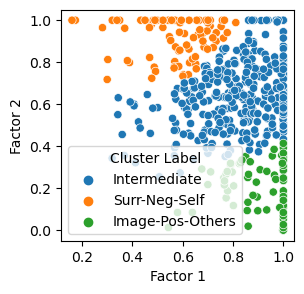

In [9]:
plt.subplots(1,1,figsize=(3,3))
sns.scatterplot(data=SCAN_INFO_df,x='Factor 1',y='Factor 2', hue='Cluster Label')

Remove scans in intermediate cluster

<Axes: xlabel='Factor 1', ylabel='Factor 2'>

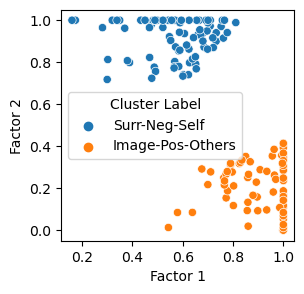

In [10]:
SCAN_INFO_df = SCAN_INFO_df[SCAN_INFO_df['Cluster Label'] != 'Intermediate']
plt.subplots(1,1,figsize=(3,3))
sns.scatterplot(data=SCAN_INFO_df,x='Factor 1',y='Factor 2', hue='Cluster Label')

In [11]:
del mot_info, clusters_info, W

In [12]:
N_scans = SCAN_INFO_df.index.get_level_values('Subject').shape[0]
N_sbjs  = SCAN_INFO_df.index.get_level_values('Subject').unique().shape[0]
print('++ Number of scans across both clustes: %d scans' % N_scans)
print('++ Number of subjects across both clusters: %d subjects' % N_sbjs)
print('++ Number of scans per cluster')
SCAN_INFO_df['Cluster Label'].value_counts()

++ Number of scans across both clustes: 159 scans
++ Number of subjects across both clusters: 83 subjects
++ Number of scans per cluster


Image-Pos-Others    81
Surr-Neg-Self       78
Name: Cluster Label, dtype: int64

***
# 2. Load the FC matrices for all scans in an Xarray

This xarray will be indexed by ```<SBJ>.<SCAN>``` on the scan dimension

In [13]:
%%time
# Create Empty Numpy Array where to hold all FC matrices. At the end we will move this into an Xarray
# ===================================================================================================
sfc_Z_arr      = np.empty((N_scans,Nrois,Nrois)) * np.nan
print('++ INFO: Shape of final Xarray: %s' % str(sfc_Z_arr.shape))
i              = 0  # Index to move through the scan dimension numerically
xr_coords_scan = [] # List of scan IDs to later use as the coordinates for the scan dimension

# For each scan in a given cluster
# ================================
for (sbj,run),_ in tqdm(SCAN_INFO_df.iterrows()):
    # Load FC matrix from disk
    # ========================
    xr_coords_scan.append('.'.join([sbj,run])) 
    _,_,sesID,_,runID,_,acqID = run.split('-')
    sfc_path = osp.join(DATA_DIR,'PrcsData',sbj,'preprocessed','func','pb06_staticFC','{acqID}_run-{runID}.{ATLAS_NAME}_000.netcc'.format(acqID=acqID,runID=runID, ATLAS_NAME=ATLAS_NAME))
    aux_cc_r = load_netcc(sfc_path)
    # Apply Fisher's transformation
    # =============================
    aux_cc_Z = aux_cc_r.apply(np.arctanh)
    np.fill_diagonal(aux_cc_Z.values,1)
    sfc_Z_arr[i,:,:] = aux_cc_Z
    # Update counter
    # ==============
    i = i + 1
    del aux_cc_r, aux_cc_Z

# Save all FC matrixes for a given atlas in XR.Array Form
# =======================================================
sfc_Z_xr = xr.DataArray(sfc_Z_arr,
                    dims=['scan','roi_x','roi_y'],
                    coords={'scan':xr_coords_scan ,
                            'roi_x':roi_info['ROI_ID'],
                            'roi_y':roi_info['ROI_ID']})
del sfc_Z_arr

++ INFO: Shape of final Xarray: (159, 380, 380)


159it [00:08, 19.87it/s]

CPU times: user 3.28 s, sys: 456 ms, total: 3.74 s
Wall time: 8.13 s


In [14]:
sfc_Z_xr.head(3)

<xarray.DataArray (scan: 3, roi_x: 3, roi_y: 3)>
array([[[1.        , 0.65182908, 0.67383976],
        [0.65182908, 1.        , 0.32675279],
        [0.67383976, 0.32675279, 1.        ]],

       [[1.        , 0.93022762, 0.72940304],
        [0.93022762, 1.        , 0.64412253],
        [0.72940304, 0.64412253, 1.        ]],

       [[1.        , 0.73038364, 0.73038364],
        [0.73038364, 1.        , 0.4110926 ],
        [0.73038364, 0.4110926 , 1.        ]]])
Coordinates:
  * scan     (scan) <U36 'sub-010014.post-ses-02-run-02-acq-AP' ... 'sub-0100...
  * roi_x    (roi_x) int64 1 2 3
  * roi_y    (roi_y) int64 1 2 3

In [15]:
SCAN_LIST = list(sfc_Z_xr.scan.values)
print(SCAN_LIST[0:5])

['sub-010014.post-ses-02-run-02-acq-AP', 'sub-010014.post-ses-02-run-02-acq-PA', 'sub-010080.post-ses-02-run-02-acq-PA', 'sub-010082.post-ses-02-run-01-acq-AP', 'sub-010082.post-ses-02-run-01-acq-PA']


***
# 3. Prepare Folders for 3dLMEr and original Data

In [19]:
RESOURCES_3dLMEr_DIR = osp.join(PRJ_DIR,'code','fc_introspection','resources','3dLMEr')
if not osp.exists(RESOURCES_3dLMEr_DIR):
    os.makedirs(RESOURCES_3dLMEr_DIR)

In [20]:
THIS_ATLAS_3dLMEr_DIR = osp.join(RESOURCES_3dLMEr_DIR, ATLAS_NAME)
if not osp.exists(THIS_ATLAS_3dLMEr_DIR):
    os.makedirs(THIS_ATLAS_3dLMEr_DIR)

In [21]:
THIS_SCENARIO_3dLMEr_DIR = osp.join(THIS_ATLAS_3dLMEr_DIR,'All_Scans')
if not osp.exists(THIS_SCENARIO_3dLMEr_DIR):
    os.makedirs(THIS_SCENARIO_3dLMEr_DIR)

In [20]:
PERM_RESULTS_DIR = osp.join(THIS_SCENARIO_3dLMEr_DIR ,'Perm_Results')
if osp.exists(PERM_RESULTS_DIR):
    rmtree(PERM_RESULTS_DIR)
os.makedirs(PERM_RESULTS_DIR)

In [94]:
PERM02_RESULTS_DIR = osp.join(THIS_SCENARIO_3dLMEr_DIR ,'Perm_Results_02')
if osp.exists(PERM02_RESULTS_DIR):
    rmtree(PERM02_RESULTS_DIR)
os.makedirs(PERM02_RESULTS_DIR)

In [20]:
PERM03_RESULTS_DIR = osp.join(THIS_SCENARIO_3dLMEr_DIR ,'Perm_Results_03')
if osp.exists(PERM03_RESULTS_DIR):
    rmtree(PERM03_RESULTS_DIR)
os.makedirs(PERM03_RESULTS_DIR)

In [21]:
FC_MATRICES_DIR = osp.join(THIS_SCENARIO_3dLMEr_DIR ,'Data')
if osp.exists(FC_MATRICES_DIR):
    rmtree(FC_MATRICES_DIR)
os.makedirs(FC_MATRICES_DIR)

In [25]:
SCRIPTS_3dMLEr_DIR = osp.join(THIS_SCENARIO_3dLMEr_DIR ,'Scripts')
#if osp.exists(SCRIPTS_3dMLEr_DIR):
#    rmtree(SCRIPTS_3dMLEr_DIR)
#os.makedirs(SCRIPTS_3dMLEr_DIR)

In [22]:
LOGS_3dMLEr_DIR = osp.join(THIS_SCENARIO_3dLMEr_DIR ,'Logs')
if osp.exists(LOGS_3dMLEr_DIR):
    rmtree(LOGS_3dMLEr_DIR)
os.makedirs(LOGS_3dMLEr_DIR)

In [23]:
for scan in tqdm(SCAN_LIST):
    sbj_id, scan_id = scan.split('.')
    this_scan_fc_matrix = sfc_Z_xr.loc[scan].values
    this_scan_fc_vector = squareform(this_scan_fc_matrix, checks=False)
    this_scan_fc_vector_path = osp.join(FC_MATRICES_DIR,f'{sbj_id}_{scan_id}.1D')
    np.savetxt(this_scan_fc_vector_path,this_scan_fc_vector,fmt='%.8f')

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:12<00:00, 13.16it/s]


***
# 4. Create Script for 3dMLEr in original data

In [26]:
REAL_DATA_ANALYSIS_SCRIPT = osp.join(SCRIPTS_3dMLEr_DIR,'All_Scans_3dLMEr_Real.sh')
with open(REAL_DATA_ANALYSIS_SCRIPT, 'w') as the_file:
    #the_file.write('module load R\n')
    #the_file.write('module load afni\n')
    the_file.write('\n')
    the_file.write('# Is SS = 3 (marginal) the correct type?\n')
    the_file.write('# Should I use bounds given this is Fisher`s of R values\n')
    the_file.write('\n')
    the_file.write('AFNI_DIR=`which afni` \n')
    the_file.write('AFNI_DIR_B=`dirname ${AFNI_DIR}` \n')
    the_file.write('echo "${AFNI_DIR_B}"\n')
    the_file.write('\n')
    the_file.write(f'Rscript $AFNI_DIR_B/3dLMEr.R -prefix {THIS_SCENARIO_3dLMEr_DIR}/LME_output_real   \\\n')
    the_file.write('       -jobs 32                  \\\n')
    the_file.write('       -model  \'Group+(1|Subj)\'  \\\n')
    the_file.write('       -SS_type 3                \\\n')
    the_file.write('       -gltCode Image_Pos_Others \'Group : 1*Image_Pos_Others\'                                \\\n')
    the_file.write('       -gltCode Surr_Neg_Self    \'Group : 1*Surr_Neg_Self\'                                  \\\n')
    the_file.write('       -gltCode Image_Pos_Others-Surr_Neg_Self \'Group : 1*Image_Pos_Others -1*Surr_Neg_Self\' \\\n')
    the_file.write('       -dataTable \\\n')
    the_file.write('        Subj Scan Group InputFile \\\n')
    for scan in tqdm(SCAN_LIST):
        sbj_id, scan_id          = scan.split('.')
        this_scan_group          = SCAN_INFO_df.loc[sbj_id,scan_id]['Cluster Label'].replace('-','_')
        this_scan_fc_vector_path = osp.join(FC_MATRICES_DIR,f'{sbj_id}_{scan_id}.1D')
        the_file.write('       %s\t%s\t%s\t%s\t\\\n' % (sbj_id,scan_id,this_scan_group,this_scan_fc_vector_path))
    the_file.write('\n')
    the_file.write('# ===================================================\n')
    the_file.write('\n')
    the_file.write('echo "=================================================================="\n')
    the_file.write('echo "=================================================================="\n')
    the_file.write('\n')
    the_file.write(f'3dFDR -qval -input {THIS_SCENARIO_3dLMEr_DIR}/LME_output_real.1D -prefix {THIS_SCENARIO_3dLMEr_DIR}/LME_output_real_qval.1D')
the_file.close()

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:00<00:00, 6672.55it/s]


In [27]:
SWARM_SCRIPTS_TO_RUN = []
SWARM_SCRIPTS_TO_RUN.append(REAL_DATA_ANALYSIS_SCRIPT)

***
# 5. Create Scripts for 3dLMEr for surrogate/permutation data

In [28]:
from sklearn.utils import shuffle

In [29]:
SBJ_LIST  = [item.split('.')[0] for item in SCAN_LIST]
SBJ_LIST_NOREPS = []
for sbj in SBJ_LIST:
    if sbj not in SBJ_LIST_NOREPS:
        SBJ_LIST_NOREPS.append(sbj)
CLUSTER_LIST = list(SCAN_INFO_df['Cluster Label'].unique())
print('SCAN_LIST:       %s' % str(SCAN_LIST[0:6]))
print('SBJ_LIST:        %s' % str(SBJ_LIST[0:10]))
print('SBJ_LIST_NOREPS: %s' % str(SBJ_LIST_NOREPS[0:10]))
print('CLUSTER_LIST:          %s' % str(CLUSTER_LIST))

SCAN_LIST:       ['sub-010014.post-ses-02-run-02-acq-AP', 'sub-010014.post-ses-02-run-02-acq-PA', 'sub-010080.post-ses-02-run-02-acq-PA', 'sub-010082.post-ses-02-run-01-acq-AP', 'sub-010082.post-ses-02-run-01-acq-PA', 'sub-010015.post-ses-02-run-01-acq-AP']
SBJ_LIST:        ['sub-010014', 'sub-010014', 'sub-010080', 'sub-010082', 'sub-010082', 'sub-010015', 'sub-010015', 'sub-010015', 'sub-010015', 'sub-010094']
SBJ_LIST_NOREPS: ['sub-010014', 'sub-010080', 'sub-010082', 'sub-010015', 'sub-010094', 'sub-010096', 'sub-010017', 'sub-010098', 'sub-010099', 'sub-010101']
CLUSTER_LIST:          ['Surr-Neg-Self', 'Image-Pos-Others']


In [30]:
INDEX_LIST = []
for (sbj,run,cl),row in SCAN_INFO_df.reset_index().set_index(['Subject','Run','Cluster Label']).iterrows():
    if (sbj,cl) not in INDEX_LIST:
        INDEX_LIST.append((sbj,cl))
N_samples = len(INDEX_LIST)
INDEX_NP = np.array(INDEX_LIST)
print('++ Number of samples going to NBS --> %d samples' % N_samples)
print('FINAL_INDEX_LIST: %s' % str(INDEX_LIST[0:6]))

++ Number of samples going to NBS --> 90 samples
FINAL_INDEX_LIST: [('sub-010014', 'Surr-Neg-Self'), ('sub-010080', 'Image-Pos-Others'), ('sub-010082', 'Surr-Neg-Self'), ('sub-010015', 'Surr-Neg-Self'), ('sub-010094', 'Surr-Neg-Self'), ('sub-010096', 'Surr-Neg-Self')]


In [31]:
N_perms = 5000
THIS_PERM_INFO = {}
for p in tqdm(np.arange(N_perms)):
    THIS_PERM_INFO[p]  = np.concatenate([INDEX_NP,shuffle(INDEX_NP[:,1]).reshape(-1,1)],axis=1)
    THIS_PERM_INFO[p]  = pd.DataFrame(THIS_PERM_INFO[p], columns=['Subject','Original Label','Permuted Label']).set_index(['Subject','Original Label'])
    THIS_PERM_ID       = str(p).zfill(5)
    THIS_PERM_ANALYSIS_SCRIPT = osp.join(SCRIPTS_3dMLEr_DIR,f'All_Scans_3dLMEr_Prem{THIS_PERM_ID}.sh')
    with open(THIS_PERM_ANALYSIS_SCRIPT,'w') as the_file:
        the_file.write('\n')
        the_file.write('# Is SS = 3 (marginal) the correct type?\n')
        the_file.write('# Should I use bounds given this is Fisher`s of R values\n')
        the_file.write('\n')
        the_file.write('AFNI_DIR=`which afni` \n')
        the_file.write('AFNI_DIR_B=`dirname ${AFNI_DIR}` \n')
        the_file.write('echo "${AFNI_DIR_B}"\n')
        the_file.write('\n')
        the_file.write(f'Rscript $AFNI_DIR_B/3dLMEr.R -prefix {PERM_RESULTS_DIR}/LME_output_perm{THIS_PERM_ID}   \\\n')
        the_file.write('       -jobs 32                  \\\n')
        the_file.write('       -model  \'Group+(1|Subj)\'  \\\n')
        the_file.write('       -SS_type 3                \\\n')
        the_file.write('       -gltCode Image_Pos_Others \'Group : 1*Image_Pos_Others\'                                \\\n')
        the_file.write('       -gltCode Surr_Neg_Self    \'Group : 1*Surr_Neg_Self\'                                  \\\n')
        the_file.write('       -gltCode Image_Pos_Others-Surr_Neg_Self \'Group : 1*Image_Pos_Others -1*Surr_Neg_Self\' \\\n')
        the_file.write('       -dataTable \\\n')
        the_file.write('        Subj Scan Group InputFile \\\n')
        for scan in SCAN_LIST:
            sbj_id, scan_id = scan.split('.')
            orig_label      = SCAN_INFO_df.loc[sbj_id,scan_id]['Cluster Label']
            new_label       = THIS_PERM_INFO[p].loc[sbj_id,orig_label]['Permuted Label']
            this_scan_group = new_label.replace('-','_')
            this_scan_fc_vector_path = osp.join(FC_MATRICES_DIR,f'{sbj_id}_{scan_id}.1D')
            the_file.write('       %s\t%s\t%s\t%s\t\\\n' % (sbj_id,scan_id,this_scan_group,this_scan_fc_vector_path))
        the_file.write('\n')
        the_file.write('# ===================================================\n')
        the_file.write('\n')
        the_file.write('echo "=================================================================="\n')
        the_file.write('echo "=================================================================="\n')
        the_file.write('\n')
        the_file.write(f'3dFDR -qval -input {PERM_RESULTS_DIR}/LME_output_perm{THIS_PERM_ID}.1D -prefix {PERM_RESULTS_DIR}/LME_output_perm{THIS_PERM_ID}.qval.1D')
    the_file.close()
    THIS_PERM_INFO_path = osp.join(PERM_RESULTS_DIR,f'LME_output_perm{THIS_PERM_ID}.info.csv')
    THIS_PERM_INFO[p].to_csv(THIS_PERM_INFO_path, header=True)
    SWARM_SCRIPTS_TO_RUN.append(THIS_PERM_ANALYSIS_SCRIPT)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [04:41<00:00, 17.74it/s]


***
# 6. Create Swarm file

In [33]:
SWARM_SCRIPT_PATH = osp.join(SCRIPTS_3dMLEr_DIR,'All_Scans_3dLMEr.SWARM.sh')

In [34]:
with open(SWARM_SCRIPT_PATH,'w') as the_file:
    the_file.write(f"#swarm -f {SWARM_SCRIPT_PATH} -g 16 -t 32 --module afni,R --time 00:40:00 -b 5 -J jobs_3dLMEr --gres=lscratch:20 --partition quick,norm --logdir {LOGS_3dMLEr_DIR}\n")
    for script in SWARM_SCRIPTS_TO_RUN:
        the_file.write(f'sh {script}\n')
the_file.close()

### Option 2: Just simply permuate (no subject identity being considered)

In [120]:
SWARM_SCRIPTS_TO_RUN_OPTION02 = []
INDEX_NP02 = SCAN_INFO_df['Cluster Label'].values

In [162]:
N_perms = 5000
THIS_PERM02_INFO = {}
for p in tqdm(np.arange(N_perms)):
    THIS_PERM02_INFO[p]  = np.concatenate([SCAN_INFO_df.reset_index()[['Subject','Run']].values,INDEX_NP02.reshape(-1,1),shuffle(INDEX_NP02).reshape(-1,1)],axis=1)
    THIS_PERM02_INFO[p]  = pd.DataFrame(THIS_PERM02_INFO[p], columns=['Subject','Run','Original Label','Permuted Label']).set_index(['Subject','Run'])
    THIS_PERM02_ID       = str(p).zfill(5)
    THIS_PERM02_ANALYSIS_SCRIPT = osp.join(SCRIPTS_3dMLEr_DIR,f'All_Scans_3dLMEr_Prem{THIS_PERM02_ID}_Option02.sh')
    with open(THIS_PERM02_ANALYSIS_SCRIPT,'w') as the_file:
        the_file.write('\n')
        the_file.write('# Is SS = 3 (marginal) the correct type?\n')
        the_file.write('# Should I use bounds given this is Fisher`s of R values\n')
        the_file.write('\n')
        the_file.write('AFNI_DIR=`which afni` \n')
        the_file.write('AFNI_DIR_B=`dirname ${AFNI_DIR}` \n')
        the_file.write('echo "${AFNI_DIR_B}"\n')
        the_file.write('\n')
        the_file.write(f'Rscript $AFNI_DIR_B/3dLMEr.R -prefix {PERM02_RESULTS_DIR}/LME_output_perm{THIS_PERM02_ID}   \\\n')
        the_file.write('       -jobs 32                  \\\n')
        the_file.write('       -model  \'Group+(1|Subj)\'  \\\n')
        the_file.write('       -SS_type 3                \\\n')
        the_file.write('       -gltCode Image_Pos_Others \'Group : 1*Image_Pos_Others\'                                \\\n')
        the_file.write('       -gltCode Surr_Neg_Self    \'Group : 1*Surr_Neg_Self\'                                  \\\n')
        the_file.write('       -gltCode Image_Pos_Others-Surr_Neg_Self \'Group : 1*Image_Pos_Others -1*Surr_Neg_Self\' \\\n')
        the_file.write('       -dataTable \\\n')
        the_file.write('        Subj Scan Group InputFile \\\n')
        for scan in SCAN_LIST:
            sbj_id, scan_id = scan.split('.')
            orig_label      = SCAN_INFO_df.loc[sbj_id,scan_id]['Cluster Label']
            new_label       = THIS_PERM02_INFO[p].loc[sbj_id,scan_id]['Permuted Label']
            this_scan_group = new_label.replace('-','_')
            this_scan_fc_vector_path = osp.join(FC_MATRICES_DIR,f'{sbj_id}_{scan_id}.1D')
            the_file.write('       %s\t%s\t%s\t%s\t\\\n' % (sbj_id,scan_id,this_scan_group,this_scan_fc_vector_path))
        the_file.write('\n')
        the_file.write('# ===================================================\n')
        the_file.write('\n')
        the_file.write('echo "=================================================================="\n')
        the_file.write('echo "=================================================================="\n')
        the_file.write('\n')
        the_file.write(f'3dFDR -qval -input {PERM02_RESULTS_DIR}/LME_output_perm{THIS_PERM02_ID}.1D -prefix {PERM02_RESULTS_DIR}/LME_output_perm{THIS_PERM02_ID}.qval.1D')
    the_file.close()
    THIS_PERM02_INFO_path = osp.join(PERM02_RESULTS_DIR,f'LME_output_perm{THIS_PERM02_ID}.info.csv')
    THIS_PERM02_INFO[p].to_csv(THIS_PERM02_INFO_path, header=True)
    SWARM_SCRIPTS_TO_RUN_OPTION02.append(THIS_PERM02_ANALYSIS_SCRIPT)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [02:55<00:00, 28.49it/s]


In [123]:
SWARM_SCRIPT_PATH_OPTION02 = osp.join(SCRIPTS_3dMLEr_DIR,'All_Scans_3dLMEr_Option02.SWARM.sh')

In [124]:
with open(SWARM_SCRIPT_PATH_OPTION02,'w') as the_file:
    the_file.write(f"#swarm -f {SWARM_SCRIPT_PATH_OPTION02} -g 16 -t 32 --module afni,R --time 00:40:00 -b 5 -J jobs_3dLMEr --gres=lscratch:20 --partition quick,norm --logdir {LOGS_3dMLEr_DIR}\n")
    for script in SWARM_SCRIPTS_TO_RUN_OPTION02:
        the_file.write(f'sh {script}\n')
the_file.close()

### Option 3: Permute Files

In [31]:
SWARM_SCRIPTS_TO_RUN_OPTION03 = []

In [32]:
N_perms          = 10000
PERM03_SCAN_INFO = SCAN_INFO_df.copy()
PERM03_SCAN_INFO = PERM03_SCAN_INFO.reset_index()
paths_to_add = []
for r,row in PERM03_SCAN_INFO.iterrows():
    sbj_id  = row['Subject']
    scan_id = row['Run']
    this_scan_fc_vector_path = osp.join(FC_MATRICES_DIR,f'{sbj_id}_{scan_id}.1D')
    paths_to_add.append(this_scan_fc_vector_path)
PERM03_SCAN_INFO['FC_Path']  = paths_to_add
THIS_PERM03_INFO = {}

In [33]:
for p in tqdm(np.arange(N_perms)):
    THIS_PERM03_INFO[p]  = np.concatenate([PERM03_SCAN_INFO[['Subject','Run','Cluster Label']].values,shuffle(PERM03_SCAN_INFO['FC_Path'].values).reshape(-1,1)],axis=1)
    THIS_PERM03_INFO[p]  = pd.DataFrame(THIS_PERM03_INFO[p], columns=['Subject','Run','Original Label','Permuted Path']).set_index(['Subject','Run'])
    THIS_PERM03_ID       = str(p).zfill(5)
    THIS_PERM03_ANALYSIS_SCRIPT = osp.join(SCRIPTS_3dMLEr_DIR,f'All_Scans_3dLMEr_Prem{THIS_PERM03_ID}_Option03.sh')
    with open(THIS_PERM03_ANALYSIS_SCRIPT,'w') as the_file:
        the_file.write('\n')
        the_file.write('# Is SS = 3 (marginal) the correct type?\n')
        the_file.write('# Should I use bounds given this is Fisher`s of R values\n')
        the_file.write('\n')
        the_file.write('AFNI_DIR=`which afni` \n')
        the_file.write('AFNI_DIR_B=`dirname ${AFNI_DIR}` \n')
        the_file.write('echo "${AFNI_DIR_B}"\n')
        the_file.write('\n')
        the_file.write(f'Rscript $AFNI_DIR_B/3dLMEr.R -prefix {PERM03_RESULTS_DIR}/LME_output_perm{THIS_PERM03_ID}   \\\n')
        the_file.write('       -jobs 32                  \\\n')
        the_file.write('       -model  \'Group+(1|Subj)\'  \\\n')
        the_file.write('       -SS_type 3                \\\n')
        the_file.write('       -gltCode Image_Pos_Others \'Group : 1*Image_Pos_Others\'                                \\\n')
        the_file.write('       -gltCode Surr_Neg_Self    \'Group : 1*Surr_Neg_Self\'                                  \\\n')
        the_file.write('       -gltCode Image_Pos_Others-Surr_Neg_Self \'Group : 1*Image_Pos_Others -1*Surr_Neg_Self\' \\\n')
        the_file.write('       -dataTable \\\n')
        the_file.write('        Subj Scan Group InputFile \\\n')
        for r,row in THIS_PERM03_INFO[p].reset_index().iterrows():
            sbj_id                   = row['Subject'] 
            scan_id                  = row['Run']
            label                    = row['Original Label']
            this_scan_group          = label.replace('-','_')
            this_scan_fc_vector_path = row['Permuted Path']
            the_file.write('       %s\t%s\t%s\t%s\t\\\n' % (sbj_id,scan_id,this_scan_group,this_scan_fc_vector_path))
        the_file.write('\n')
        the_file.write('# ===================================================\n')
        the_file.write('\n')
        the_file.write('echo "=================================================================="\n')
        the_file.write('echo "=================================================================="\n')
        the_file.write('\n')
        the_file.write(f'3dFDR -qval -input {PERM03_RESULTS_DIR}/LME_output_perm{THIS_PERM03_ID}.1D -prefix {PERM03_RESULTS_DIR}/LME_output_perm{THIS_PERM03_ID}.qval.1D')
    the_file.close()
    THIS_PERM03_INFO_path = osp.join(PERM03_RESULTS_DIR,f'LME_output_perm{THIS_PERM03_ID}.info.csv')
    THIS_PERM03_INFO[p].to_csv(THIS_PERM03_INFO_path, header=True)
    SWARM_SCRIPTS_TO_RUN_OPTION03.append(THIS_PERM03_ANALYSIS_SCRIPT)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [05:52<00:00, 28.38it/s]


In [34]:
SWARM_SCRIPT_PATH_OPTION03 = osp.join(SCRIPTS_3dMLEr_DIR,'All_Scans_3dLMEr_Option03.SWARM.sh')
print(SWARM_SCRIPT_PATH_OPTION03)

/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/3dLMEr/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/Scripts/All_Scans_3dLMEr_Option03.SWARM.sh


In [35]:
%%time
with open(SWARM_SCRIPT_PATH_OPTION03,'w') as the_file:
    #the_file.write(f"#swarm -f {SWARM_SCRIPT_PATH_OPTION03} -g 16 -t 32 --module afni,R --time 00:40:00 -b 5 -J jobs_3dLMEr --gres=lscratch:20 --partition quick,norm --logdir {LOGS_3dMLEr_DIR}\n")
    the_file.write(f"#swarm -f {SWARM_SCRIPT_PATH_OPTION03} -g 16 -t 32 --module afni,R -b 10 -J jobs_3dLMEr --gres=lscratch:20 --logdir {LOGS_3dMLEr_DIR}\n")
    for script in tqdm(SWARM_SCRIPTS_TO_RUN_OPTION03):
        the_file.write(f'sh {script}\n')
the_file.close()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:00<00:00, 1565506.12it/s]

CPU times: user 6.2 ms, sys: 3.87 ms, total: 10.1 ms
Wall time: 10.2 ms


***
# 7. Load Results for real case

In [28]:
PERM_RESULTS_DIR   = osp.join(THIS_SCENARIO_3dLMEr_DIR ,'Perm_Results')
PERM02_RESULTS_DIR = osp.join(THIS_SCENARIO_3dLMEr_DIR ,'Perm_Results_02')
PERM03_RESULTS_DIR = osp.join(THIS_SCENARIO_3dLMEr_DIR ,'Perm_Results_03')

In [29]:
from bct.algorithms import get_components
import networkx as nx

In [30]:
LME_OUTPUT_COLUMNS = ['group.chisq2', 'Image_Pos_Others', 'Image_Pos_Others.Z',
       'Surr_Neg_Self', 'Surr_Neg_Self.Z', 'Image_Pos_Others-Surr_Neg_Self',
       'Image_Pos_Others-Surr_Neg_Self.Z']
EDGE_THRESHOLD_Z = 2.58
#EDGE_THRESHOLD_Z = 1.96
EDGE_THRESHOLD_Z = 3.0
#EDGE_THRESHOLD_pval = norm.sf(abs(EDGE_THRESHOLD_Z))*2
EDGE_THRESHOLD_pval = norm.sf(abs(EDGE_THRESHOLD_Z))
print('++ INFO: Edge Level Thresholding Z=%.2f, pval=%.5f' %(EDGE_THRESHOLD_Z,EDGE_THRESHOLD_pval))

++ INFO: Edge Level Thresholding Z=3.00, pval=0.00135


In [31]:
# On page 22 of the NBS Manual it is clearly stated that all p-values are set according to one-sided distributions. 
# For coherence with that work, we will use the same assumption here when going from p to Z values
EDGE_THRESHOLD_pval = 0.001
EDGE_THRESHOLD_Z    = norm.isf(EDGE_THRESHOLD_pval)
print('++ INFO: Edge Level Thresholding Z=%.2f, pval=%.5f' %(EDGE_THRESHOLD_Z,EDGE_THRESHOLD_pval))

++ INFO: Edge Level Thresholding Z=3.09, pval=0.00100


In [49]:
LME_RESULTS_PATH    = osp.join(THIS_SCENARIO_3dLMEr_DIR,'LME_output_real.1D')
LME_RESULTS         = pd.read_csv(LME_RESULTS_PATH, sep=' ', comment='#', header=None)
LME_RESULTS         = LME_RESULTS.drop(0,axis=1)
LME_RESULTS.columns = LME_OUTPUT_COLUMNS

In [50]:
REAL_COMPONENT_SIZES    = {}
REAL_ADJACENCY_MATRICES = {}
REAL_COMPONENT_MATRICES = {}
for this_adj_vector, contrast in zip([(LME_RESULTS['Image_Pos_Others-Surr_Neg_Self.Z']>EDGE_THRESHOLD_Z).astype(int), (LME_RESULTS['Image_Pos_Others-Surr_Neg_Self.Z']<-EDGE_THRESHOLD_Z).astype(int)],
                                     ['Image-Pos-Others > Surr-Neg-Self',                                                 'Surr-Neg-Self > Image-Pos-Others']):
    # Convert adjacency matrix to full matrix shape
    REAL_ADJACENCY_MATRICES[contrast] = squareform(this_adj_vector).astype(int)
    this_comps, this_comps_size       = get_components(REAL_ADJACENCY_MATRICES[contrast])
    
    # Make a copy to keep the components
    REAL_COMPONENT_MATRICES[contrast] = REAL_ADJACENCY_MATRICES[contrast].copy()
    
    # Find the index to components > 1
    ind_sz,       = np.where(this_comps_size > 1)
    ind_sz       += 1
    
    # Count how many of these are there
    nr_components = np.size(ind_sz)
    
    # Create empty array to record their sizes (number of nodes)
    sz_links      = np.zeros((nr_components,))
    
    for i in range(nr_components):
        nodes,      = np.where(ind_sz[i] == this_comps)
        sz_links[i] = np.sum(REAL_ADJACENCY_MATRICES[contrast][np.ix_(nodes, nodes)]) / 2
        REAL_COMPONENT_MATRICES[contrast][np.ix_(nodes, nodes)] *= (i + 2)

    # subtract 1 to delete any edges not comprising a component
    REAL_COMPONENT_MATRICES[contrast][np.where(REAL_COMPONENT_MATRICES[contrast])] -= 1

    # Show maximum component size
    if np.size(sz_links):
        REAL_COMPONENT_SIZES[contrast] = np.max(sz_links)
        print('++ INFO[%s]: Maximum Size of Components = %d links' % (contrast,REAL_COMPONENT_SIZES[contrast]))
    else:
        # max_sz=0
        raise ValueError('++ ERROR: Size of true matrix is zero - Degenerate!')

    assert sum(this_adj_vector) == np.sum(sz_links), "#ERROR"

++ INFO[Image-Pos-Others > Surr-Neg-Self]: Maximum Size of Components = 4028 links
++ INFO[Surr-Neg-Self > Image-Pos-Others]: Maximum Size of Components = 6813 links


In [34]:
from utils.plotting import hvplot_fc_nwlevel

In [35]:
data_f1GTf2 = pd.DataFrame(REAL_ADJACENCY_MATRICES['Image-Pos-Others > Surr-Neg-Self'],
                          index   = roi_info.set_index(['Hemisphere','Network','ROI_Name','ROI_ID','RGB']).index, 
                          columns = roi_info.set_index(['Hemisphere','Network','ROI_Name','ROI_ID','RGB']).index)
data_f2GTf1 = pd.DataFrame(REAL_ADJACENCY_MATRICES['Surr-Neg-Self > Image-Pos-Others'],
                          index   = roi_info.set_index(['Hemisphere','Network','ROI_Name','ROI_ID','RGB']).index, 
                          columns = roi_info.set_index(['Hemisphere','Network','ROI_Name','ROI_ID','RGB']).index)
plot_f1GTf2 = hvplot_fc_nwlevel(data_f1GTf2, title='', add_net_colors=True, add_net_labels=True, mode='count', cmap='oranges', clim_max=50, labels_text_color='black').opts(toolbar=None)
plot_f2GTf1 = hvplot_fc_nwlevel(data_f2GTf1, title='', add_net_colors=True, add_net_labels=True, mode='count', cmap='blues', clim_max=50, labels_text_color='black').opts(toolbar=None)
dashboard = pn.Column(pn.pane.Markdown('# Edge Level Thresholding Z=%.2f, pval=%.5f' %(EDGE_THRESHOLD_Z,EDGE_THRESHOLD_pval)),
                    pn.Row(plot_f1GTf2,plot_f2GTf1))
dashboard_server = dashboard.show(port=port_tunnel,open=False)
print('++ CLICK ON LINK TO SEE MATRIX')

Launching server at http://localhost:42897
++ CLICK ON LINK TO SEE MATRIX


In [226]:
#dashboard = pn.Tabs([pn.Row(pd.DataFrame(REAL_ADJACENCY_MATRICES['Image-Pos-Others > Surr-Neg-Self']).hvplot.heatmap())],['Image-Pos-Others > Surr-Neg-Self'])
dashboard = pn.Tabs(                    ('Image-Pos-Others > Surr-Neg-Self - %d links' % REAL_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'],
                       pn.Row(pd.DataFrame(REAL_ADJACENCY_MATRICES['Image-Pos-Others > Surr-Neg-Self'],index=roi_info['ROI_Name'], columns=roi_info['ROI_Name']).hvplot.heatmap(aspect='square', frame_width=1200,cmap='viridis').opts(xrotation=90),
                       pd.DataFrame(REAL_COMPONENT_MATRICES['Image-Pos-Others > Surr-Neg-Self'],index=roi_info['ROI_Name'], columns=roi_info['ROI_Name']).hvplot.heatmap(aspect='square', frame_width=1200,cmap='viridis').opts(xrotation=90))),
                    ('Surr-Neg-Self > Image-Pos-Others - %d links' % REAL_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'],
                       pn.Row(pd.DataFrame(REAL_ADJACENCY_MATRICES['Surr-Neg-Self > Image-Pos-Others'],index=roi_info['ROI_Name'], columns=roi_info['ROI_Name']).hvplot.heatmap(aspect='square', frame_width=1200,cmap='viridis').opts(xrotation=90),
                       pd.DataFrame(REAL_COMPONENT_MATRICES['Surr-Neg-Self > Image-Pos-Others'],index=roi_info['ROI_Name'], columns=roi_info['ROI_Name']).hvplot.heatmap(aspect='square', frame_width=1200,cmap='viridis').opts(xrotation=90)))
                   )
dashboard_server = dashboard.show(port=port_tunnel,open=False)
print('++ CLICK ON LINK TO SEE MATRIX')

Launching server at http://localhost:42883
++ CLICK ON LINK TO SEE MATRIX


In [36]:
dashboard_server.stop()

# 8. Load Results for the Surrogate cases

## Original Permutation scheme in which we destroy group, but not subjects

In [ ]:
%%time
N_perms = 5000
PERM_COMPONENT_SIZES={'Image-Pos-Others > Surr-Neg-Self':[],
                      'Surr-Neg-Self > Image-Pos-Others':[]}
PERM_CONTRAST_r     = np.zeros((N_perms,380,380))
PERM_CONTRAST_Z     = np.zeros((N_perms,380,380))
PERM_CONTRAST_Comps = np.zeros((2,N_perms,380,380))
PERM_PERCENT_CORRECT_LABELS = []
for p in tqdm(np.arange(N_perms), desc='Permutation'):
    this_perm_results_path          = osp.join(PERM_RESULTS_DIR,'LME_output_perm%s.1D' % str(p).zfill(5))
    if not osp.exists(this_perm_results_path):
        print('++ WARNING: Missing permutation: %s' %this_perm_results_path)
        continue
    this_perm_3dLMEr_output         = pd.read_csv(this_perm_results_path, sep=' ', comment='#', header=None)
    this_perm_3dLMEr_output         = this_perm_3dLMEr_output.drop(0,axis=1)
    this_perm_3dLMEr_output.columns = LME_OUTPUT_COLUMNS
    PERM_CONTRAST_r[p,:,:] = squareform(this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self'])
    PERM_CONTRAST_Z[p,:,:] = squareform(this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self.Z'])
    #if p > 100:
    #    dfsfdsdf
    for c,contrast in enumerate(['Image-Pos-Others > Surr-Neg-Self','Surr-Neg-Self > Image-Pos-Others']):
        # Extract adjacency matrix of interest in vector form by thresholding at the edge-level
        if contrast == 'Image-Pos-Others > Surr-Neg-Self':
            this_perm_adj_vector = (this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self.Z']>=EDGE_THRESHOLD_Z).astype(int)
        else:
            this_perm_adj_vector = (this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self.Z']<=-EDGE_THRESHOLD_Z).astype(int)
        
        # Convert adjacency matrix to full matrix shape
        this_perm_adj_matrix                  = squareform(this_perm_adj_vector).astype(int)
        this_perm_comps, this_perm_comps_size = get_components(this_perm_adj_matrix)
    
        # Make a copy to keep the components
        PERM_CONTRAST_Comps[c,p] = this_perm_adj_matrix.copy()
    
        # Find the index to components > 1
        this_perm_ind_sz,       = np.where(this_perm_comps_size > 1)
        this_perm_ind_sz       += 1
    
        # Count how many of these are there
        this_perm_nr_components = np.size(this_perm_ind_sz)
    
        # Create empty array to record their sizes (number of nodes)
        this_perm_sz_links      = np.zeros((this_perm_nr_components,))
    
        for i in range(this_perm_nr_components):
            this_perm_nodes,                = np.where(this_perm_ind_sz[i] == this_perm_comps)
            this_perm_sz_links[i] = np.sum(this_perm_adj_matrix[np.ix_(this_perm_nodes, this_perm_nodes)]) / 2
            PERM_CONTRAST_Comps[c,p][np.ix_(this_perm_nodes, this_perm_nodes)] *= (i + 2)

        # subtract 1 to delete any edges not comprising a component
        PERM_CONTRAST_Comps[c,p][np.where(PERM_CONTRAST_Comps[c,p])] -= 1

        # Show maximum component size
        if np.size(this_perm_sz_links):
            PERM_COMPONENT_SIZES[contrast].append(np.max(this_perm_sz_links))
        else:
            PERM_COMPONENT_SIZES[contrast].append(0)
        assert sum(this_perm_adj_vector) == np.sum(this_perm_sz_links), "#ERROR"
    

Permutation:  17%|██████████████████▊                                                                                              | 834/5000 [02:13<11:22,  6.10it/s]

In [51]:
sum(PERM_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'] > REAL_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'])/len(PERM_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'])

0.0002

In [52]:
sum(PERM_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'] > REAL_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'])/len(PERM_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'] )

0.0

In [44]:
import itertools

3.090232306167813

In [48]:
%%time
print('++ INFO: Edge Level Thresholding Z=%.2f, pval=%.5f' %(EDGE_THRESHOLD_Z,EDGE_THRESHOLD_pval))
N_perms = 5000
PERM_COMPONENT_SIZES_OPTION03        = {'Image-Pos-Others > Surr-Neg-Self':[],
                                        'Surr-Neg-Self > Image-Pos-Others':[]}
PERM_CONTRAST_r_OPTION03             = np.zeros((N_perms,380,380))
PERM_CONTRAST_Z_OPTION03             = np.zeros((N_perms,380,380))
PERM_CONTRAST_Comps_OPTION03         = np.zeros((2,N_perms,380,380))
PERM_PERCENT_CORRECT_LABELS_OPTION03 = []
for p in tqdm(np.arange(N_perms), desc='Permutation'):
    this_perm_results_path          = osp.join(PERM03_RESULTS_DIR,'LME_output_perm%s.1D' % str(p).zfill(5))
    if not osp.exists(this_perm_results_path):
        print('++ WARNING: Missing permutation: %s' %this_perm_results_path)
        continue
    
    this_perm_3dLMEr_output         = pd.read_csv(this_perm_results_path, sep=' ', comment='#', header=None)
    this_perm_3dLMEr_output         = this_perm_3dLMEr_output.drop(0,axis=1)
    this_perm_3dLMEr_output.columns = LME_OUTPUT_COLUMNS
    PERM_CONTRAST_r_OPTION03[p,:,:] = squareform(this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self'])
    PERM_CONTRAST_Z_OPTION03[p,:,:] = squareform(this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self.Z'])
    
    for c,contrast in enumerate(['Image-Pos-Others > Surr-Neg-Self','Surr-Neg-Self > Image-Pos-Others']):
        # Extract adjacency matrix of interest in vector form by thresholding at the edge-level
        if contrast == 'Image-Pos-Others > Surr-Neg-Self':
            this_perm_adj_vector = (this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self.Z']>EDGE_THRESHOLD_Z).astype(int)
        else:
            this_perm_adj_vector = (this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self.Z']<-EDGE_THRESHOLD_Z).astype(int)
        
        # Convert adjacency matrix to full matrix shape
        this_perm_adj_matrix                  = squareform(this_perm_adj_vector).astype(int)
        this_perm_comps, this_perm_comps_size = get_components(this_perm_adj_matrix)
    
        # Make a copy to keep the components
        PERM_CONTRAST_Comps_OPTION03[c,p] = this_perm_adj_matrix.copy()
    
        # Find the index to components > 1
        this_perm_ind_sz,       = np.where(this_perm_comps_size > 1)
        this_perm_ind_sz       += 1
    
        # Count how many of these are there
        this_perm_nr_components = np.size(this_perm_ind_sz)
    
        # Create empty array to record their sizes (number of nodes)
        this_perm_sz_links      = np.zeros((this_perm_nr_components,))
    
        for i in range(this_perm_nr_components):
            this_perm_nodes,                = np.where(this_perm_ind_sz[i] == this_perm_comps)
            this_perm_sz_links[i] = np.sum(this_perm_adj_matrix[np.ix_(this_perm_nodes, this_perm_nodes)]) / 2
            PERM_CONTRAST_Comps_OPTION03[c,p][np.ix_(this_perm_nodes, this_perm_nodes)] *= (i + 2)

        # subtract 1 to delete any edges not comprising a component
        PERM_CONTRAST_Comps_OPTION03[c,p][np.where(PERM_CONTRAST_Comps_OPTION03[c,p])] -= 1

        # Show maximum component size
        if np.size(this_perm_sz_links):
            PERM_COMPONENT_SIZES_OPTION03[contrast].append(np.max(this_perm_sz_links))
        else:
            PERM_COMPONENT_SIZES_OPTION03[contrast].append(0)
        assert sum(this_perm_adj_vector) == np.sum(this_perm_sz_links), "#ERROR"
    

++ INFO: Edge Level Thresholding Z=1.64, pval=0.05000


Permutation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [16:16<00:00,  5.12it/s]

CPU times: user 12min 30s, sys: 1min 5s, total: 13min 35s
Wall time: 16min 16s


In [53]:
sum(PERM_COMPONENT_SIZES_OPTION03['Image-Pos-Others > Surr-Neg-Self'] > REAL_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'])/len(PERM_COMPONENT_SIZES_OPTION03['Image-Pos-Others > Surr-Neg-Self'])

0.3062

In [54]:
sum(PERM_COMPONENT_SIZES_OPTION03['Surr-Neg-Self > Image-Pos-Others'] > REAL_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'])/len(PERM_COMPONENT_SIZES_OPTION03['Surr-Neg-Self > Image-Pos-Others'] )

0.1142

In [481]:
%%time
##### NO RELOAD ###########
###########################
print('++ INFO: Edge Level Thresholding Z=%.2f, pval=%.5f' %(EDGE_THRESHOLD_Z,EDGE_THRESHOLD_pval))
N_perms = 5000
PERM_COMPONENT_SIZES_OPTION03        = {'Image-Pos-Others > Surr-Neg-Self':[],
                                        'Surr-Neg-Self > Image-Pos-Others':[]}
#PERM_CONTRAST_r_OPTION03             = np.zeros((N_perms,380,380))
#PERM_CONTRAST_Z_OPTION03             = np.zeros((N_perms,380,380))
#PERM_CONTRAST_Comps_OPTION03         = np.zeros((2,N_perms,380,380))
#for p in tqdm(np.arange(N_perms), desc='Permutation'):
for p in tqdm(np.arange(100), desc='Permutation'):
    #this_perm_results_path          = osp.join(PERM03_RESULTS_DIR,'LME_output_perm%s.1D' % str(p).zfill(5))
    #if not osp.exists(this_perm_results_path):
    #    print('++ WARNING: Missing permutation: %s' %this_perm_results_path)
    #    continue
    
    #this_perm_3dLMEr_output         = pd.read_csv(this_perm_results_path, sep=' ', comment='#', header=None)
    #this_perm_3dLMEr_output         = this_perm_3dLMEr_output.drop(0,axis=1)
    #this_perm_3dLMEr_output.columns = LME_OUTPUT_COLUMNS
    #PERM_CONTRAST_r_OPTION03[p,:,:] = squareform(this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self'])
    #PERM_CONTRAST_Z_OPTION03[p,:,:] = squareform(this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self.Z'])
    
    for c,contrast in enumerate(['Image-Pos-Others > Surr-Neg-Self','Surr-Neg-Self > Image-Pos-Others']):
        # Extract adjacency matrix of interest in vector form by thresholding at the edge-level
        if contrast == 'Image-Pos-Others > Surr-Neg-Self':
            this_perm_adj_vector = (squareform(PERM_CONTRAST_Z_OPTION03[p,:,:])>EDGE_THRESHOLD_Z).astype(int)
        else:
            this_perm_adj_vector = (squareform(PERM_CONTRAST_Z_OPTION03[p,:,:])<-EDGE_THRESHOLD_Z).astype(int)
        
        # Convert adjacency matrix to full matrix shape
        this_perm_adj_matrix                  = squareform(this_perm_adj_vector).astype(int)
        this_perm_comps, this_perm_comps_size = get_components(this_perm_adj_matrix)
    
        # Make a copy to keep the components
        PERM_CONTRAST_Comps_OPTION03[c,p] = this_perm_adj_matrix.copy()
    
        # Find the index to components > 1
        this_perm_ind_sz,       = np.where(this_perm_comps_size > 1)
        this_perm_ind_sz       += 1
    
        # Count how many of these are there
        this_perm_nr_components = np.size(this_perm_ind_sz)
    
        # Create empty array to record their sizes (number of nodes)
        this_perm_sz_links      = np.zeros((this_perm_nr_components,))
    
        for i in range(this_perm_nr_components):
            this_perm_nodes,                = np.where(this_perm_ind_sz[i] == this_perm_comps)
            this_perm_sz_links[i] = np.sum(this_perm_adj_matrix[np.ix_(this_perm_nodes, this_perm_nodes)]) / 2
            PERM_CONTRAST_Comps_OPTION03[c,p][np.ix_(this_perm_nodes, this_perm_nodes)] *= (i + 2)

        # subtract 1 to delete any edges not comprising a component
        PERM_CONTRAST_Comps_OPTION03[c,p][np.where(PERM_CONTRAST_Comps_OPTION03[c,p])] -= 1

        # Show maximum component size
        if np.size(this_perm_sz_links):
            PERM_COMPONENT_SIZES_OPTION03[contrast].append(np.max(this_perm_sz_links))
        else:
            print('hello')
            PERM_COMPONENT_SIZES_OPTION03[contrast].append(0)
        assert sum(this_perm_adj_vector) == np.sum(this_perm_sz_links), "#ERROR"

++ INFO: Edge Level Thresholding Z=3.09, pval=0.00100


Permutation:  30%|██████████████████████████████████████████████████████████▊                                                                                                                                         | 30/100 [00:02<00:05, 13.55it/s]

hello


Permutation:  44%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                                             | 44/100 [00:03<00:04, 13.44it/s]

hello


Permutation:  62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 62/100 [00:04<00:02, 13.69it/s]

hello


Permutation:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 72/100 [00:05<00:02, 13.60it/s]

hello


Permutation: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.67it/s]

CPU times: user 7.32 s, sys: 6.71 ms, total: 7.32 s
Wall time: 7.32 s


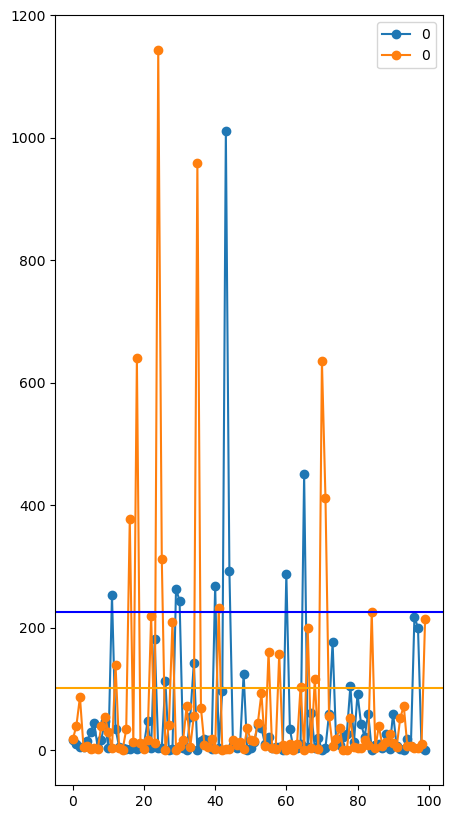

In [496]:
fig, ax = plt.subplots(1,1,figsize=(5,10))
pd.DataFrame(PERM_COMPONENT_SIZES_OPTION03['Surr-Neg-Self > Image-Pos-Others']).plot(ax=ax, marker='o')
pd.DataFrame(PERM_COMPONENT_SIZES_OPTION03['Image-Pos-Others > Surr-Neg-Self']).plot(ax=ax, marker='o')
ax.axhline(y=REAL_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'],c='b')
ax.axhline(y=REAL_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'],c='orange')

<Axes: >

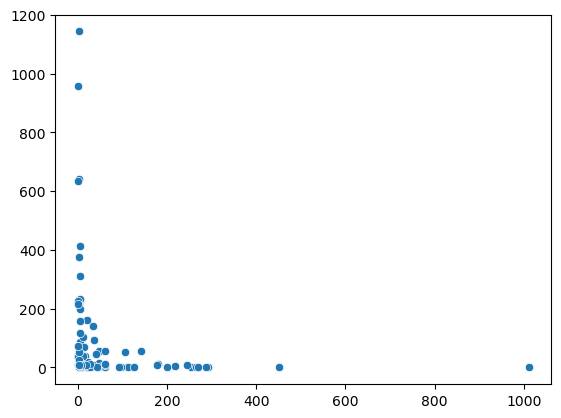

In [497]:
sns.scatterplot(x=PERM_COMPONENT_SIZES_OPTION03['Surr-Neg-Self > Image-Pos-Others'], y=PERM_COMPONENT_SIZES_OPTION03['Image-Pos-Others > Surr-Neg-Self'])

In [48]:
sum(PERM_COMPONENT_SIZES_OPTION03['Image-Pos-Others > Surr-Neg-Self'] > REAL_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'])/len(PERM_COMPONENT_SIZES_OPTION03['Image-Pos-Others > Surr-Neg-Self'])

0.1601

In [49]:
sum(PERM_COMPONENT_SIZES_OPTION03['Surr-Neg-Self > Image-Pos-Others'] > REAL_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'])/len(PERM_COMPONENT_SIZES_OPTION03['Surr-Neg-Self > Image-Pos-Others'] )

0.0674

(0.0, 800.0)

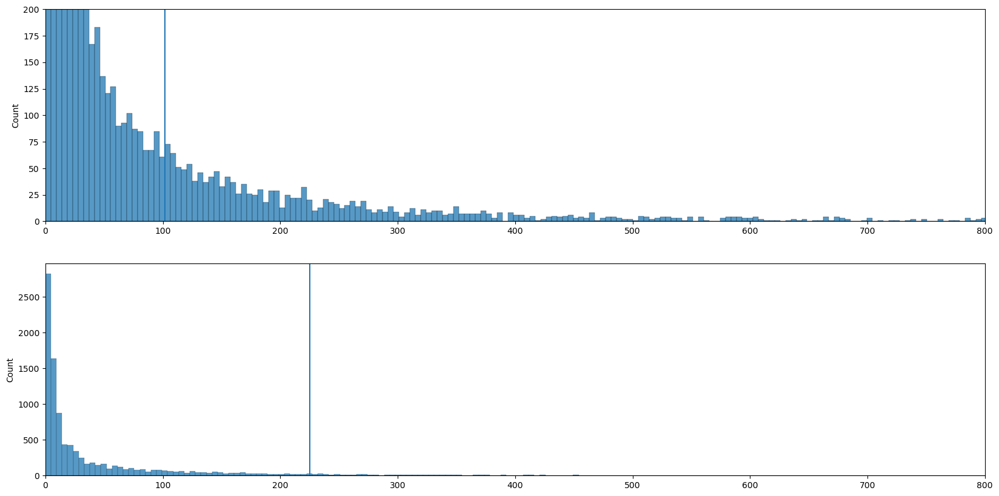

In [50]:
fig,axs=plt.subplots(2,1,figsize=(20,10))
sns.histplot(PERM_COMPONENT_SIZES_OPTION03['Image-Pos-Others > Surr-Neg-Self'], ax=axs[0])
axs[0].axvline(ymin=0, ymax=1100, x=REAL_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'])
sns.histplot(PERM_COMPONENT_SIZES_OPTION03['Surr-Neg-Self > Image-Pos-Others'], ax=axs[1])
axs[1].axvline(ymin=0, ymax=1100, x=REAL_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'])
axs[0].set_xlim(0,800)
axs[0].set_ylim(0,200)
axs[1].set_xlim(0,800)

In [347]:
sum(PERM_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'] > REAL_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'])/N_perms

0.124

In [341]:
a = np.array(PERM_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'])[np.array(PERCENT_CORRECT_LABELS)>50]

In [342]:
sum(a>REAL_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'])/len(a)

0.11207920792079208

In [326]:
perm_slider = pn.widgets.IntSlider(name='Permutation', start=0, end=N_perms, step=1, value=0)
@pn.depends(perm_slider)
def plot_components_matrix(p):
    fig,axs = plt.subplots(1,3,figsize=(20,5))
    #sns.heatmap(PERM_CONTRAST_Z[p],ax=axs[0], cmap='RdBu_r', vmin=-3, vmax=3, square=True)
    sns.heatmap(PERM_CONTRAST_Z[p]> EDGE_THRESHOLD_Z,ax=axs[0], cmap='RdBu_r', vmin=-3, vmax=3, square=True, linewidths=.5, linecolor='k', mask=PERM_CONTRAST_Z[p]> EDGE_THRESHOLD_Z)
    sns.heatmap(PERM_CONTRAST_Comps[0,p],cmap=sns.cubehelix_palette(start=2, rot=0, dark=0.4, light=1),ax=axs[1], square=True)
    SgtI_comps = sns.heatmap(PERM_CONTRAST_Comps[1,p],cmap=sns.cubehelix_palette(start=2, rot=0, dark=0.4, light=1),ax=axs[2], square=True)
    plt.close()
    out = pn.pane.Matplotlib(fig)
    #IgtS_contr = pd.DataFrame(PERM_CONTRAST_Z[p],index=roi_info['ROI_Name'], columns=roi_info['ROI_Name']).hvplot.heatmap(aspect='square', frame_width=500,cmap='RdBu_r', title='Contrast I > S', clim=(-2,2)).opts(xrotation=90)
    #IgtS_comps = pd.DataFrame(PERM_CONTRAST_Comps[0,p],index=roi_info['ROI_Name'], columns=roi_info['ROI_Name']).hvplot.heatmap(aspect='square', frame_width=500,cmap='viridis').opts(xrotation=90)
    #SgtI_comps = pd.DataFrame(PERM_CONTRAST_Comps[1,p],index=roi_info['ROI_Name'], columns=roi_info['ROI_Name']).hvplot.heatmap(aspect='square', frame_width=500,cmap='viridis').opts(xrotation=90)
    #out = pn.Row(IgtS_contr,IgtS_comps,SgtI_comps)
    return pn.Row(out,pn.pane.Markdown('Percent Correct Labels = %.2f | Largest (I > S) has %d nodes |  Largest (S > I) has %d nodes ' % (PERCENT_CORRECT_LABELS[p],
                                                                                                            PERM_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'][p],
                                                                                                            PERM_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'][p])))
dashboard = pn.Column(perm_slider,plot_components_matrix)
dashboard_server = dashboard.show(port=port_tunnel,open=False)
print('++ CLICK ON LINK TO SEE MATRIX')
#pn.Columnumn(pn.widget.Sli)
#PERM_CONTRAST_Comps[0]

Launching server at http://localhost:42883
++ CLICK ON LINK TO SEE MATRIX


In [325]:
dashboard_server.stop()

<Axes: ylabel='Count'>

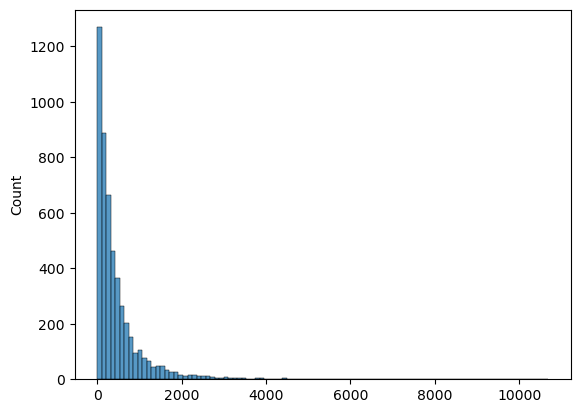

In [93]:
sns.histplot(PERM_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'], bins=100)

In [196]:
sum(PERM_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'] > REAL_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'])/len(PERM_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'])

0.24075924075924077

In [197]:
sum(PERM_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'] > REAL_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'])/len(PERM_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'])

0.12387612387612387

In [229]:
%%time
PERM_COMPONENT_SIZES_OPTION02={'Image-Pos-Others > Surr-Neg-Self':[],
                      'Surr-Neg-Self > Image-Pos-Others':[]}
PERM_CONTRAST_r_OPTION02 = np.zeros((N_perms,380,380))
PERM_CONTRAST_Z_OPTION02 = np.zeros((N_perms,380,380))
PERM_PERCENT_CORRECT_LABELS_OPTION02 = []
for p in tqdm(np.arange(N_perms), desc='Permutation'):
    this_perm_results_path          = osp.join(PERM02_RESULTS_DIR,'LME_output_perm%s.1D' % str(p).zfill(5))
    if not osp.exists(this_perm_results_path):
        print('++ WARNING: Missing permutation: %s' %this_perm_results_path)
        continue
    this_perm_3dLMEr_output         = pd.read_csv(this_perm_results_path, sep=' ', comment='#', header=None)
    this_perm_3dLMEr_output         = this_perm_3dLMEr_output.drop(0,axis=1)
    this_perm_3dLMEr_output.columns = LME_OUTPUT_COLUMNS
    PERM_CONTRAST_r_OPTION02[p,:,:] = squareform(this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self'])
    PERM_CONTRAST_Z_OPTION02[p,:,:] = squareform(this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self.Z'])
    #PERM_PERCENT_CORRECT_LABELS.append(100*(THIS_PERM_INFO.reset_index().set_index('Subject')['Original Label'] == THIS_PERM_INFO.reset_index().set_index('Subject')['Permuted Label']).sum() / THIS_PERM_INFO.shape[0])
    #print(this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self'].max(),this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self'].min(), end=' | ')
    #print(this_perm_3dLMEr_output['Surr_Neg_Self'].max(),this_perm_3dLMEr_output['Surr_Neg_Self'].min(), end=' | ')
    #print(this_perm_3dLMEr_output['Image_Pos_Others'].max(),this_perm_3dLMEr_output['Image_Pos_Others'].min(), end='\n')
    #if p > 1000:
    #    dfsfdsdf
    for contrast in ['Image-Pos-Others > Surr-Neg-Self','Surr-Neg-Self > Image-Pos-Others']:
        # Extract adjacency matrix of interest in vector form by thresholding at the edge-level
        if contrast == 'Image-Pos-Others > Surr-Neg-Self':
            this_perm_adj_vector = (this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self.Z']>=EDGE_THRESHOLD_Z).astype(int)
        else:
            this_perm_adj_vector = (this_perm_3dLMEr_output['Image_Pos_Others-Surr_Neg_Self.Z']<=-EDGE_THRESHOLD_Z).astype(int)
        
        # Convert adjacency matrix to full matrix shape
        this_perm_adj_matrix                  = squareform(this_perm_adj_vector).astype(int)
        this_perm_comps, this_perm_comps_size = get_components(this_perm_adj_matrix)
    
        # Make a copy to keep the components
        this_perm_comp_matrix = this_perm_adj_matrix.copy()
    
        # Find the index to components > 1
        this_perm_ind_sz,       = np.where(this_perm_comps_size > 1)
        this_perm_ind_sz       += 1
    
        # Count how many of these are there
        this_perm_nr_components = np.size(this_perm_ind_sz)
    
        # Create empty array to record their sizes (number of nodes)
        this_perm_sz_links      = np.zeros((this_perm_nr_components,))
    
        for i in range(this_perm_nr_components):
            this_perm_nodes,                = np.where(this_perm_ind_sz[i] == this_perm_comps)
            this_perm_sz_links[i] = np.sum(this_perm_adj_matrix[np.ix_(this_perm_nodes, this_perm_nodes)]) / 2
            this_perm_comp_matrix[np.ix_(this_perm_nodes, this_perm_nodes)] *= (i + 2)

        # subtract 1 to delete any edges not comprising a component
        this_perm_comp_matrix[np.where(this_perm_comp_matrix)] -= 1

        # Show maximum component size
        if np.size(this_perm_sz_links):
            PERM_COMPONENT_SIZES_OPTION02[contrast].append(np.max(this_perm_sz_links))
        else:
            PERM_COMPONENT_SIZES_OPTION02[contrast].append(0)
        assert sum(this_perm_adj_vector) == np.sum(this_perm_sz_links), "#ERROR"
    

Permutation:  37%|███████████████████████████████████████████████████████████████████████▎                                                                                                                         | 1848/5000 [04:54<06:31,  8.05it/s]

++ WARNING: Missing permutation: /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/3dLMEr/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/Perm_Results_02/LME_output_perm01846.1D


Permutation:  37%|███████████████████████████████████████████████████████████████████████▍                                                                                                                         | 1852/5000 [04:55<06:01,  8.70it/s]

++ WARNING: Missing permutation: /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/3dLMEr/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/Perm_Results_02/LME_output_perm01850.1D


Permutation:  57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 2848/5000 [07:33<04:06,  8.73it/s]

++ WARNING: Missing permutation: /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/3dLMEr/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/Perm_Results_02/LME_output_perm02846.1D


Permutation:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                   | 2852/5000 [07:33<03:47,  9.44it/s]

++ WARNING: Missing permutation: /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/3dLMEr/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/Perm_Results_02/LME_output_perm02850.1D


Permutation:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 3848/5000 [10:11<02:16,  8.46it/s]

++ WARNING: Missing permutation: /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/3dLMEr/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/Perm_Results_02/LME_output_perm03846.1D


Permutation:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 3852/5000 [10:12<02:05,  9.16it/s]

++ WARNING: Missing permutation: /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/3dLMEr/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/Perm_Results_02/LME_output_perm03850.1D


Permutation:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 4848/5000 [12:49<00:18,  8.14it/s]

++ WARNING: Missing permutation: /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/3dLMEr/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/Perm_Results_02/LME_output_perm04846.1D


Permutation:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 4852/5000 [12:49<00:15,  9.26it/s]

++ WARNING: Missing permutation: /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/3dLMEr/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/Perm_Results_02/LME_output_perm04850.1D


Permutation: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [13:14<00:00,  6.29it/s]

CPU times: user 10min 19s, sys: 10.1 s, total: 10min 29s
Wall time: 13min 14s


In [166]:
sum(PERM_COMPONENT_SIZES_OPTION02['Image-Pos-Others > Surr-Neg-Self'] > REAL_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'])/len(PERM_COMPONENT_SIZES_OPTION02['Image-Pos-Others > Surr-Neg-Self'])

0.2560654779304297

In [167]:
sum(PERM_COMPONENT_SIZES_OPTION02['Surr-Neg-Self > Image-Pos-Others'] > REAL_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'])/len(PERM_COMPONENT_SIZES_OPTION02['Surr-Neg-Self > Image-Pos-Others'])

0.0941245249926922

In [168]:
len(PERM_COMPONENT_SIZES_OPTION02['Surr-Neg-Self > Image-Pos-Others'])

3421

<Axes: ylabel='Density'>

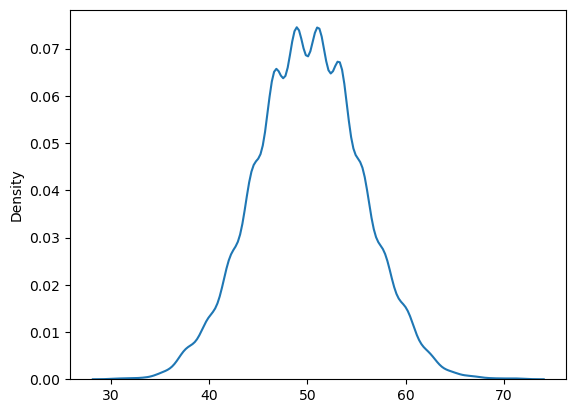

In [170]:
sns.kdeplot(PERCENT_CORRECT_LABELS)

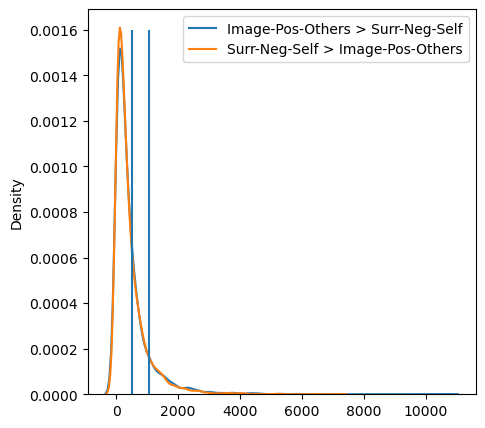

In [183]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
sns.kdeplot(PERM_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'], label='Surr-Neg-Self > Image-Pos-Others', ax=ax)
sns.kdeplot(PERM_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'], label='Image-Pos-Others > Surr-Neg-Self',ax=ax)
ax.vlines(x=REAL_COMPONENT_SIZES['Image-Pos-Others > Surr-Neg-Self'], ymin=0, ymax=0.0016)
ax.vlines(x=REAL_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others'], ymin=0, ymax=0.0016)
ax.legend(['Image-Pos-Others > Surr-Neg-Self','Surr-Neg-Self > Image-Pos-Others'])

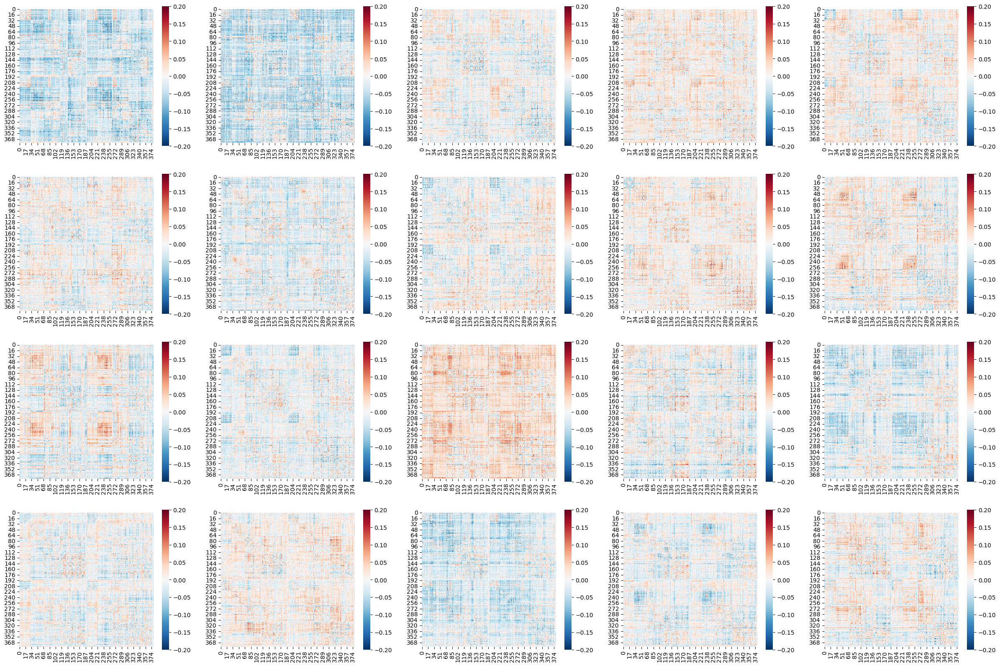

In [184]:
fig,axs=plt.subplots(4,5, figsize=(30,20))
for p in np.arange(20):
    sns.heatmap(PERM_CONTRAST_r[p], cmap='RdBu_r', vmin=-.2,vmax=.2, ax=axs[np.unravel_index(p,(4,5))], square=True)
    #axs[np.unravel_index(p,(4,5))].set_title(PERM_PERCENT_CORRECT_LABELS[p])

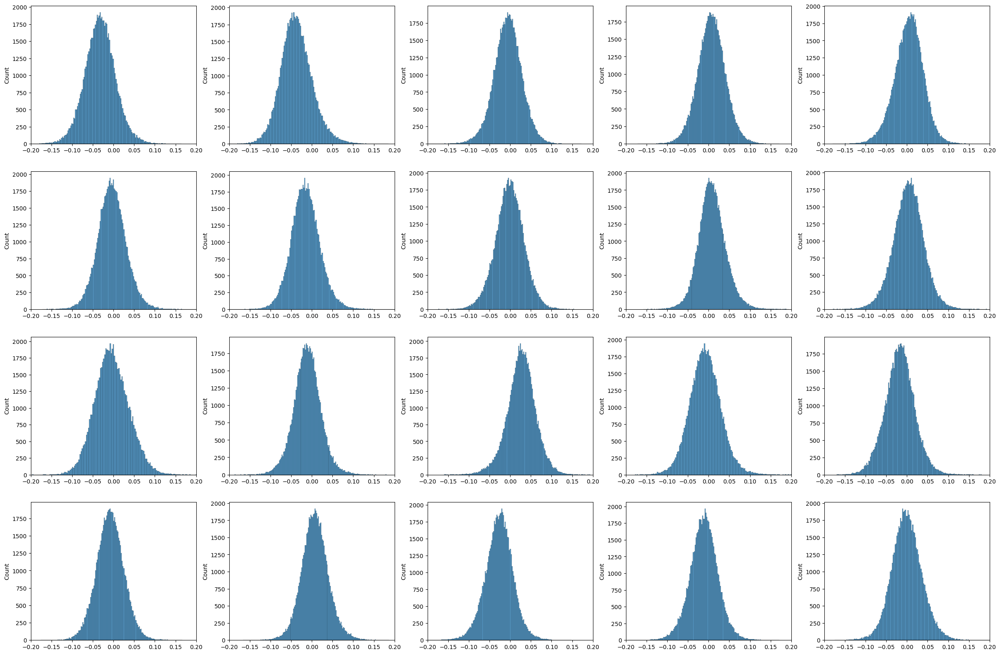

In [47]:
fig,axs=plt.subplots(4,5, figsize=(30,20))
for p in np.arange(20):
    sns.histplot(squareform(PERM_CONTRAST_r[p]), ax=axs[np.unravel_index(p,(4,5))])
    axs[np.unravel_index(p,(4,5))].set_xlim(-.2,.2)

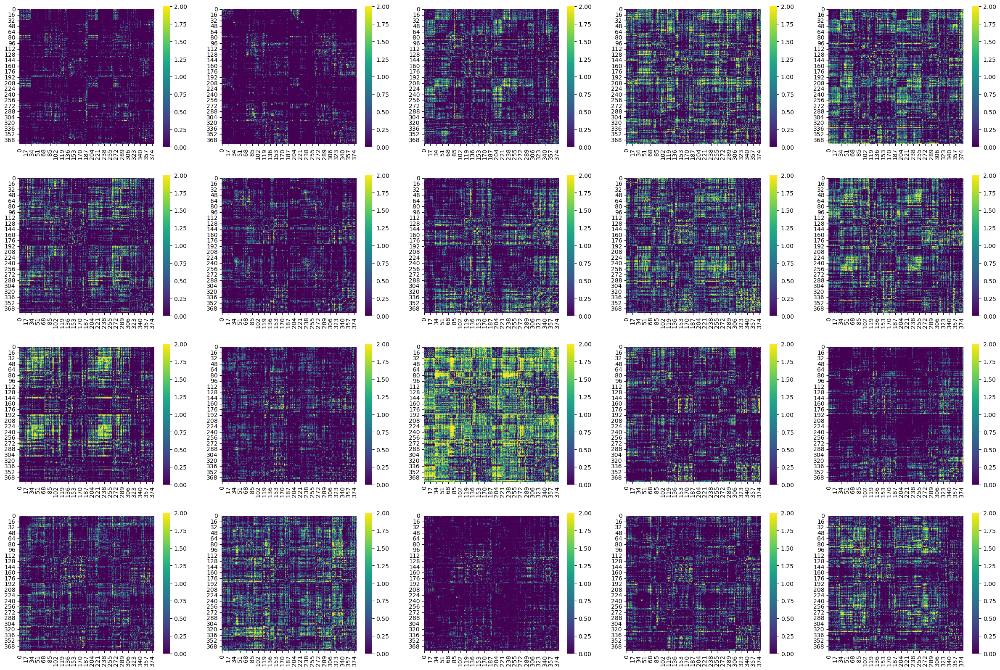

In [48]:
fig,axs=plt.subplots(4,5, figsize=(30,20))
for p in np.arange(20):
    sns.heatmap(PERM_CONTRAST_Z[p], cmap='viridis', vmin=0,vmax=2, ax=axs[np.unravel_index(p,(4,5))], square=True)

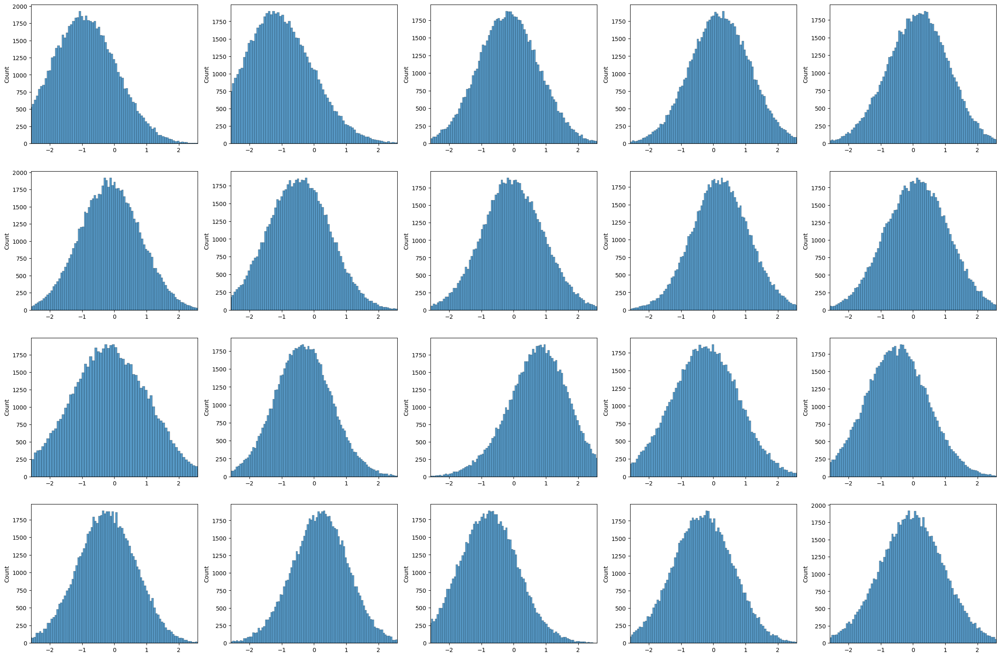

In [49]:
fig,axs=plt.subplots(4,5, figsize=(30,20))
for p in np.arange(20):
    sns.histplot(squareform(PERM_CONTRAST_Z[p]), ax=axs[np.unravel_index(p,(4,5))])
    axs[np.unravel_index(p,(4,5))].set_xlim(-EDGE_THRESHOLD_Z,EDGE_THRESHOLD_Z)

<Axes: ylabel='Frequency'>

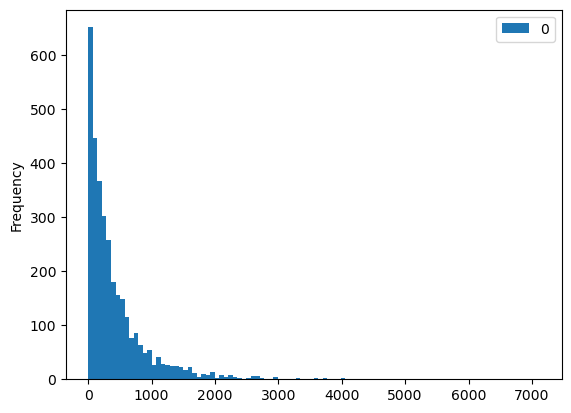

In [71]:
pd.DataFrame(PERM_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others']).plot.hist(bins=100)

In [72]:
REAL_COMPONENT_SIZES['Surr-Neg-Self > Image-Pos-Others']

1055.0

In [296]:
LME_RESULTS['Image_Pos_Others.Z'].quantile(.02)

-3.8160963999999997

<Axes: >

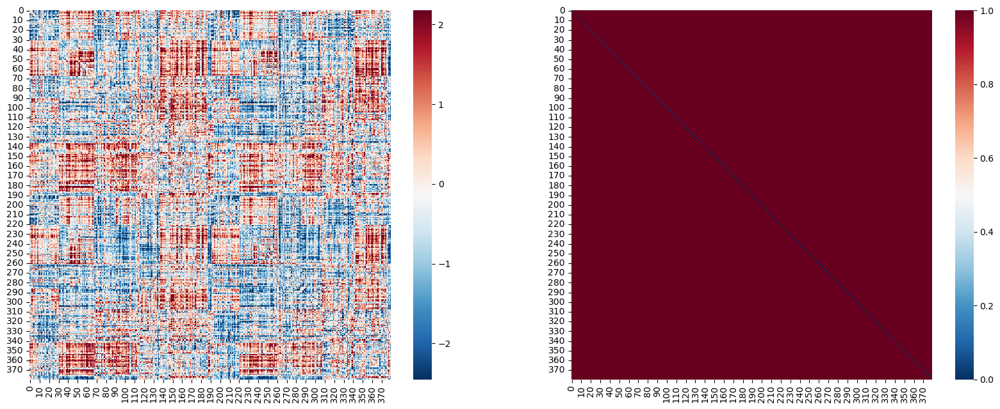

In [387]:
c='Image_Pos_Others-Surr_Neg_Self.Z'
fig, axs = plt.subplots(1,2,figsize=(20,7.5))
sns.heatmap(squareform(LME_RESULTS[c]), cmap='RdBu_r', vmin=LME_RESULTS[c].quantile(.02), vmax=LME_RESULTS[c].quantile(.98), ax=axs[0])
sns.heatmap(squareform(this_perm_3dLMEr_output[c]), cmap='RdBu_r', ax=axs[1])

<Axes: ylabel='Frequency'>

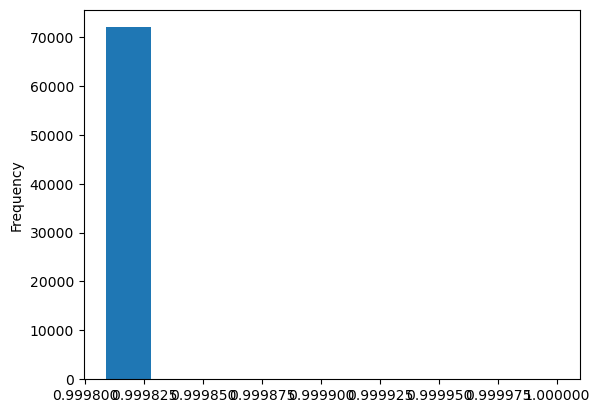

In [388]:
this_perm_3dLMEr_output[c].plot.hist()

<Axes: >

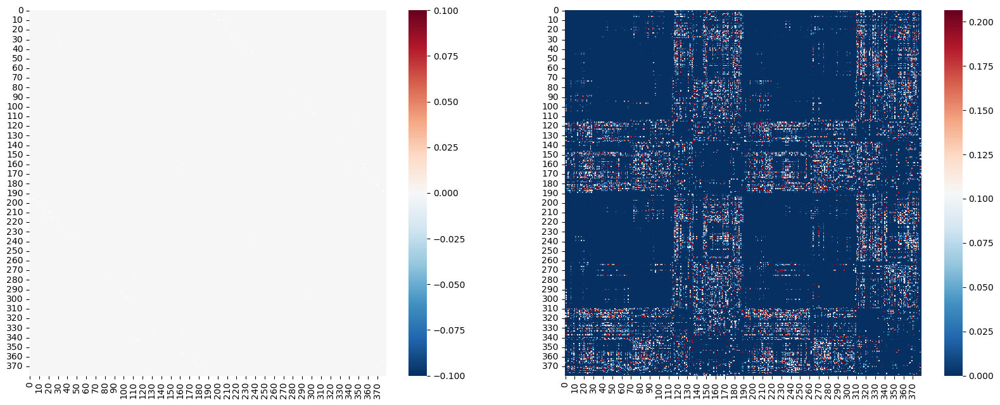

In [337]:
c='Surr_Neg_Self.Z'
fig, axs = plt.subplots(1,2,figsize=(20,7.5))
sns.heatmap(squareform(LME_RESULTS[c]-JAVI01_RESULTS[c]),          cmap='RdBu_r', vmin=(LME_RESULTS[c]-JAVI01_RESULTS[c]).quantile(.002), vmax=(LME_RESULTS[c]-JAVI01_RESULTS[c]).quantile(.99), ax=axs[0])
sns.heatmap(squareform(this_perm_3dLMEr_output[c]), cmap='RdBu_r', vmin=this_perm_3dLMEr_output[c].quantile(.02), vmax=this_perm_3dLMEr_output[c].quantile(.98), ax=axs[1])

21

In [379]:
JAVI01_RESULTS_PATH    = osp.join(THIS_SCENARIO_3dLMEr_DIR,'LME_output_javi01.1D')
JAVI01_RESULTS         = pd.read_csv(LME_RESULTS_PATH, sep=' ', comment='#', header=None)
JAVI01_RESULTS         = JAVI01_RESULTS.drop(0,axis=1)
JAVI01_RESULTS.columns = LME_OUTPUT_COLUMNS

In [344]:
THIS_PERM_INFO.value_counts()

Permuted Label  
Surr-Neg-Self       46
Image-Pos-Others    44
dtype: int64

In [383]:
N_perms = 5000
percent_right_labels = []
for p in np.arange(N_perms):
    THIS_PERM_INFO  = np.concatenate([INDEX_NP,shuffle(INDEX_NP[:,1]).reshape(-1,1)],axis=1)
    THIS_PERM_INFO  = pd.DataFrame(THIS_PERM_INFO, columns=['Subject','Original Label','Permuted Label']).set_index(['Subject','Original Label'])
    THIS_PERM_ID    = str(p).zfill(5)
    THIS_PERM_ANALYSIS_SCRIPT = osp.join(SCRIPTS_3dMLEr_DIR,f'All_Scans_3dLMEr_Prem{THIS_PERM_ID}.sh')
    percent_right_labels.append(100*(THIS_PERM_INFO.reset_index().set_index('Subject')['Original Label'] == THIS_PERM_INFO.reset_index().set_index('Subject')['Permuted Label']).sum() / THIS_PERM_INFO.shape[0])

<Axes: ylabel='Frequency'>

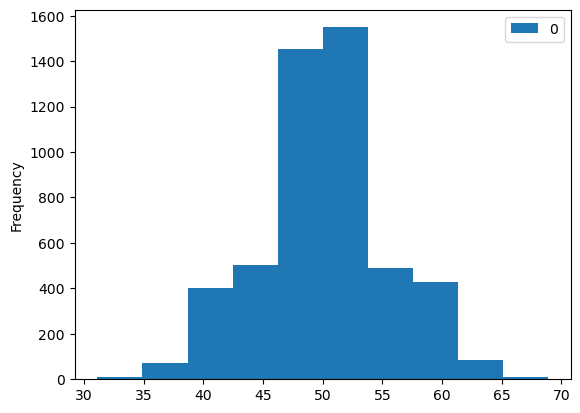

In [384]:
pd.DataFrame(percent_right_labels).plot.hist()

# Percentages of correct labels in permutations

In [136]:
PERCENT_CORRECT_LABELS=[]
for p in tqdm(np.arange(N_perms)):
    aux_path = osp.join(PERM_RESULTS_DIR,'LME_output_perm%s.info.csv' % str(p).zfill(5))
    aux = pd.read_csv(aux_path)
    PERCENT_CORRECT_LABELS.append(100*(aux['Original Label'] == aux['Permuted Label']).sum()/aux.shape[0])

<Axes: ylabel='Frequency'>

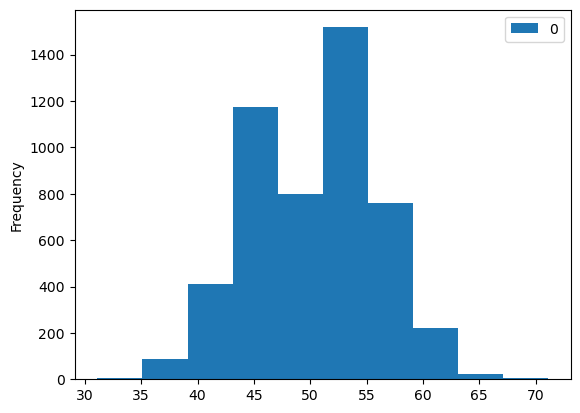

In [139]:
pd.DataFrame(PERCENT_CORRECT_LABELS).plot.hist()

In [140]:
PERCENT_CORRECT_LABELS_OPTION02=[]
for p in tqdm(np.arange(N_perms)):
    aux_path = osp.join(PERM02_RESULTS_DIR,'LME_output_perm%s.info.csv' % str(p).zfill(5))
    aux = pd.read_csv(aux_path)
    PERCENT_CORRECT_LABELS_OPTION02.append(100*(aux['Original Label'] == aux['Permuted Label']).sum()/aux.shape[0])

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [00:11<00:00, 419.79it/s]


<Axes: ylabel='Frequency'>

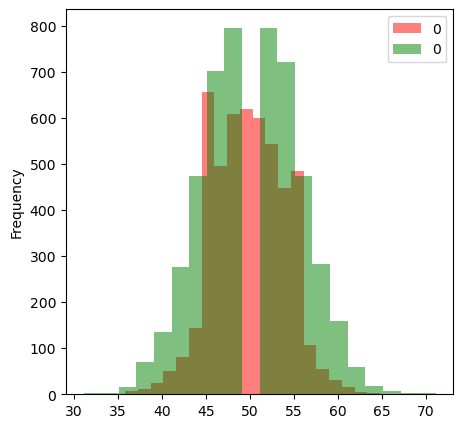

In [161]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
pd.DataFrame(PERCENT_CORRECT_LABELS_OPTION02).plot.hist(bins=20, ax=ax, label='Option02', color='r', alpha=.5)
pd.DataFrame(PERCENT_CORRECT_LABELS).plot.hist(bins=20, ax=ax, label='Option01', color='g', alpha=.5)

In [158]:
pd.DataFrame(PERCENT_CORRECT_LABELS).plot.hist?

Signature:
plot.hist(
    x,
    bins=None,
    range=None,
    density=False,
    weights=None,
    cumulative=False,
    bottom=None,
    histtype='bar',
    align='mid',
    orientation='vertical',
    rwidth=None,
    log=False,
    color=None,
    label=None,
    stacked=False,
    *,
    data=None,
    **kwargs,
)
Docstring:
Compute and plot a histogram.

This method uses `numpy.histogram` to bin the data in *x* and count the
number of values in each bin, then draws the distribution either as a
`.BarContainer` or `.Polygon`. The *bins*, *range*, *density*, and
*weights* parameters are forwarded to `numpy.histogram`.

If the data has already been binned and counted, use `~.bar` or
`~.stairs` to plot the distribution::

    counts, bins = np.histogram(x)
    plt.stairs(counts, bins)

Alternatively, plot pre-computed bins and counts using ``hist()`` by
treating each bin as a single point with a weight equal to its count::

    plt.hist(bins[:-1], bins, weights=counts)

The data inpu